In [1]:
import cv2
import math
import csv
import os
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image, ImageDraw, ImageFont
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
from datetime import datetime
%matplotlib inline

https://www.digitalocean.com/community/tutorials/what-is-new-with-yolo

## EJERCICIO 1 
Vamos a usar el modleo YOLOv11 para detectar objetos en una imagen (en este caso vamos a aplicar el modelo directamente sin entrenarlo).
Vamos a aplicarlo en las imagenes deteccion_objetos.jpg y bus.jpg

Partiendo de la imagen deteccion_objetos.jpg y bus.jpg.




0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 2.1ms
1: 640x640 4 persons, 1 bus, 2.1ms
Speed: 1.5ms preprocess, 2.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


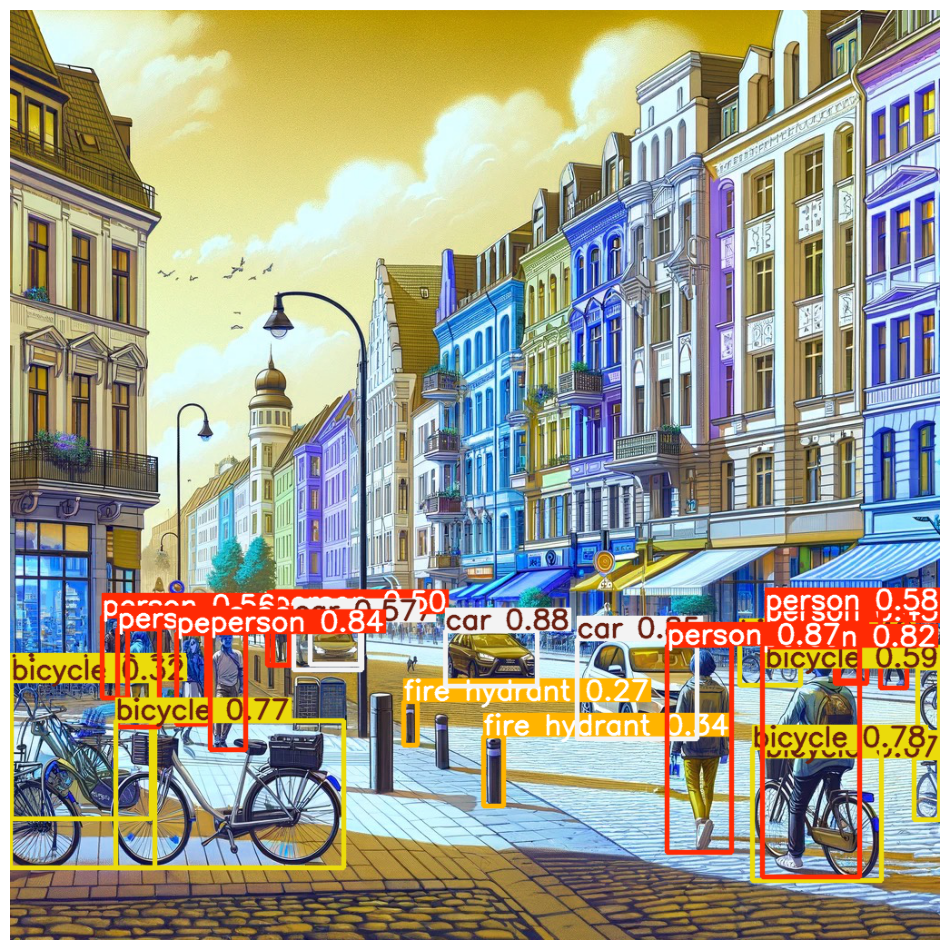

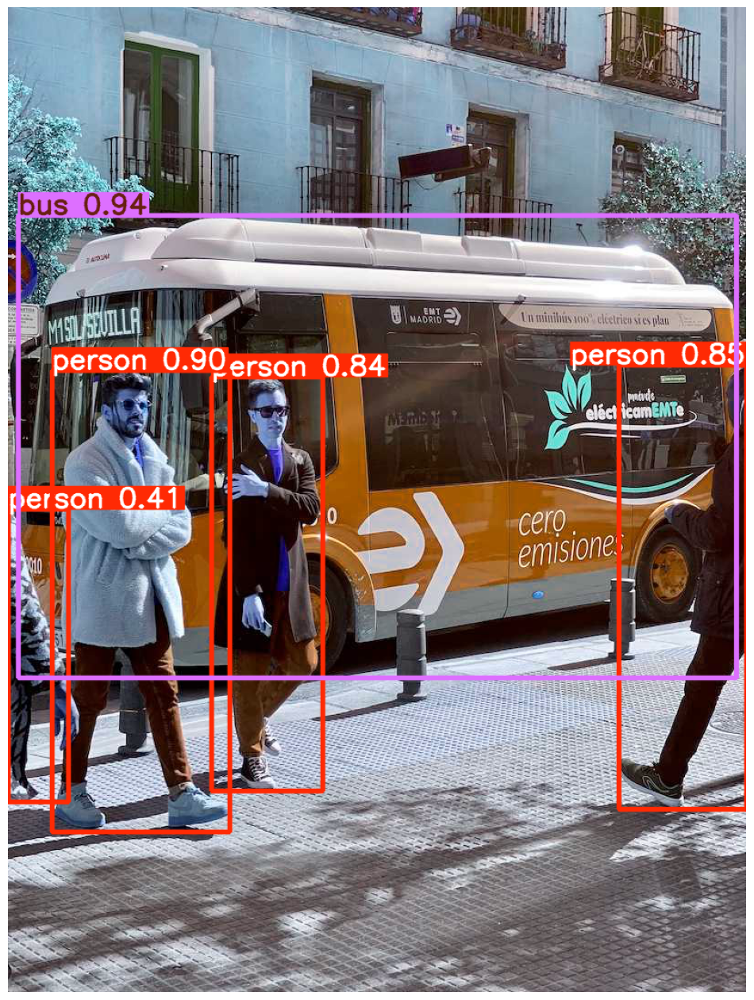

In [8]:
model = YOLO("Resultados/yolo11n.pt")

image_paths = ["recursos/deteccion_objetos.jpg", "recursos/bus.jpg"]
results = model(image_paths)

for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off")  # Opcional: oculta los ejes
    plt.show()

## EJERCICIO 2
Vamos a repetir el ejercicio pero ahora vamos a modificar la salida para que quede de la siguiente forma:

![Imagen con la el resultado que se quiere obtener 1](Datos/deteccion_objetos_solucion.png)

![Imagen con la el resultado que se quiere obtener 1](Datos/bus_solucion.png)

Además sólo quiero que detecte los objetos cuya probabilidad sea mayor al 50%.

Ten en cuenta que al aplicar el modelo a una imagen devuelve diferentes datos:
 * Cajas:
    * Clase (cls)
    * Probabilidad (score)
    * Coordenadas de la caja xyxy

Para representar la imagen y añadir rectángulos, texto... puedes usar Image, ImageDraw, ImageFont de PIL. Dibujas la imagen con .Draw de (ImageDraw) con .rectangle y .text puedes ir añadiendo texto y rectángulos.


0: 640x640 11 persons, 7 bicycles, 4 cars, 2 fire hydrants, 2.1ms
1: 640x640 4 persons, 1 bus, 2.1ms
Speed: 1.5ms preprocess, 2.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


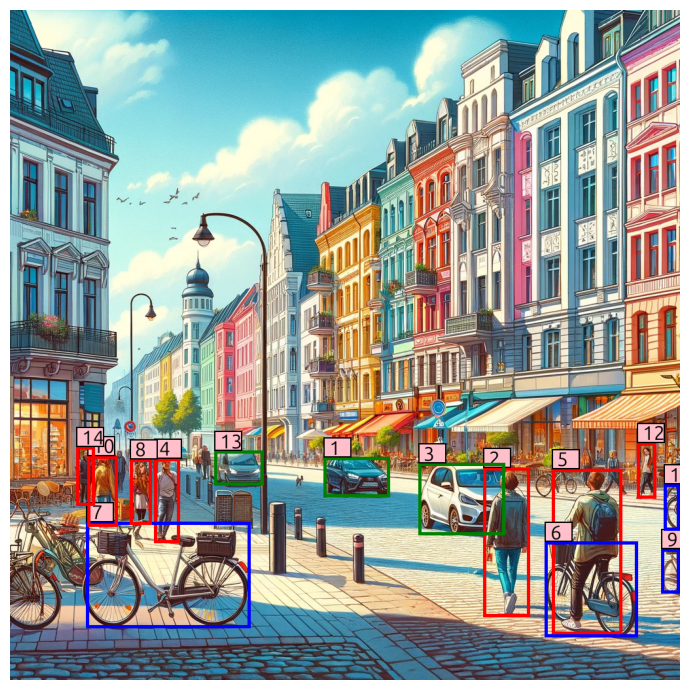

Recuadro 1: Clase=car, Score=0.88, Caja=tensor([479.8883, 683.6398, 580.6799, 744.2516], device='cuda:0')
Recuadro 2: Clase=person, Score=0.87, Caja=tensor([723.8831, 699.6281, 794.2302, 927.2527], device='cuda:0')
Recuadro 3: Clase=car, Score=0.85, Caja=tensor([624.3212, 692.6537, 756.9240, 802.4709], device='cuda:0')
Recuadro 4: Clase=person, Score=0.84, Caja=tensor([220.4718, 685.4314, 259.8442, 814.4322], device='cuda:0')
Recuadro 5: Clase=person, Score=0.82, Caja=tensor([828.3610, 701.1053, 935.8299, 954.4529], device='cuda:0')
Recuadro 6: Clase=bicycle, Score=0.78, Caja=tensor([817.9751, 812.5693, 959.1559, 958.2740], device='cuda:0')
Recuadro 7: Clase=bicycle, Score=0.77, Caja=tensor([116.6321, 782.1196, 367.2387, 944.4985], device='cuda:0')
Recuadro 8: Clase=person, Score=0.72, Caja=tensor([183.0309, 686.3452, 216.2440, 786.7228], device='cuda:0')
Recuadro 9: Clase=bicycle, Score=0.67, Caja=tensor([ 995.5506,  823.9893, 1023.6957,  891.5317], device='cuda:0')
Recuadro 10: Clase

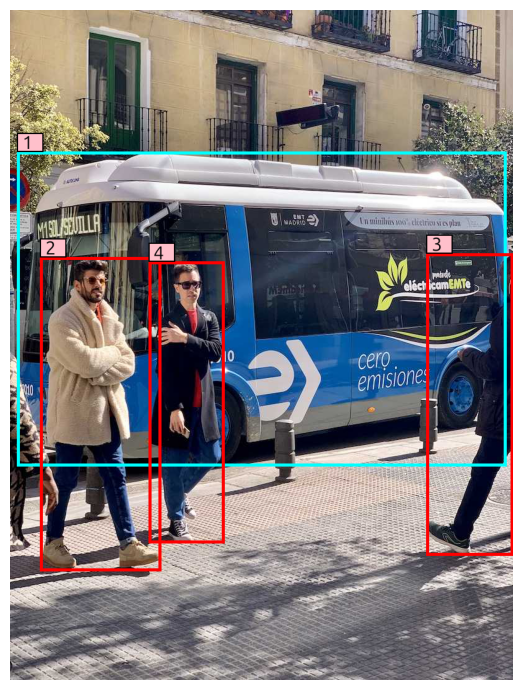

Recuadro 1: Clase=bus, Score=0.94, Caja=tensor([ 11.9472, 228.3151, 799.1895, 735.3087], device='cuda:0')
Recuadro 2: Clase=person, Score=0.90, Caja=tensor([ 48.6464, 398.2117, 243.0680, 904.5064], device='cuda:0')
Recuadro 3: Clase=person, Score=0.85, Caja=tensor([670.6041, 392.3168, 810.0000, 879.6082], device='cuda:0')
Recuadro 4: Clase=person, Score=0.84, Caja=tensor([223.0595, 405.5998, 345.2839, 859.7147], device='cuda:0')


In [9]:
model = YOLO("Resultados/yolo11n.pt")
image_paths = ["recursos/deteccion_objetos.jpg", "recursos/bus.jpg"]
results = model(image_paths)

# Obtén la imagen con los recuadros
for i,_ in enumerate(results):
    detections = results[i].boxes 
    filtered_detections = []  

    for j, (cls, score, box) in enumerate(zip(detections.cls, detections.conf, detections.xyxy)):
        if score > 0.5:  
            filtered_detections.append((j, cls, score, box))

    image = Image.open(image_paths[i]).convert("RGB")
    draw = ImageDraw.Draw(image)
    font = ImageFont.truetype("usr/share/fonts/truetype/ubuntu/Ubuntu-B.ttf", size=30)

    legend = []

    colors = ["red", "blue", "green", "orange", "purple", "cyan", "magenta", "yellow", "pink", "brown"]
    def get_color_for_class(cls_idx):
        return colors[cls_idx % len(colors)] 

    for idx, (i, cls, score, box) in enumerate(filtered_detections, start=1):
        class_name = model.names[int(cls)]
        color = get_color_for_class(int(cls))
        #box = box.tolist()

        legend.append(f"Recuadro {idx}: Clase={class_name}, Score={score:.2f}, Caja={box}")
        
        draw.rectangle([box[0], box[1], box[2], box[3]], outline=color, width=5)
        draw.rectangle([box[0], box[1]-30, box[0]+2 + 40, box[1]],fill="black")
        draw.rectangle([box[0]+2, box[1]-28, box[0] + 40, box[1]-2],fill="pink")
        draw.text((box[0]+8, box[1]-32), str(idx), fill="black",font=font)

    plt.figure(figsize=(13,7))
    plt.imshow(image)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    [print(i) for i in legend] 

## EJERCICIO 3
YOLOv11 también sirve para segmentación, aplica segmentación a las dos imágenes con las que estamos trabajando


0: 640x640 11 persons, 8 bicycles, 3 cars, 1 backpack, 5.3ms
1: 640x640 4 persons, 1 bus, 5.3ms
Speed: 1.5ms preprocess, 5.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


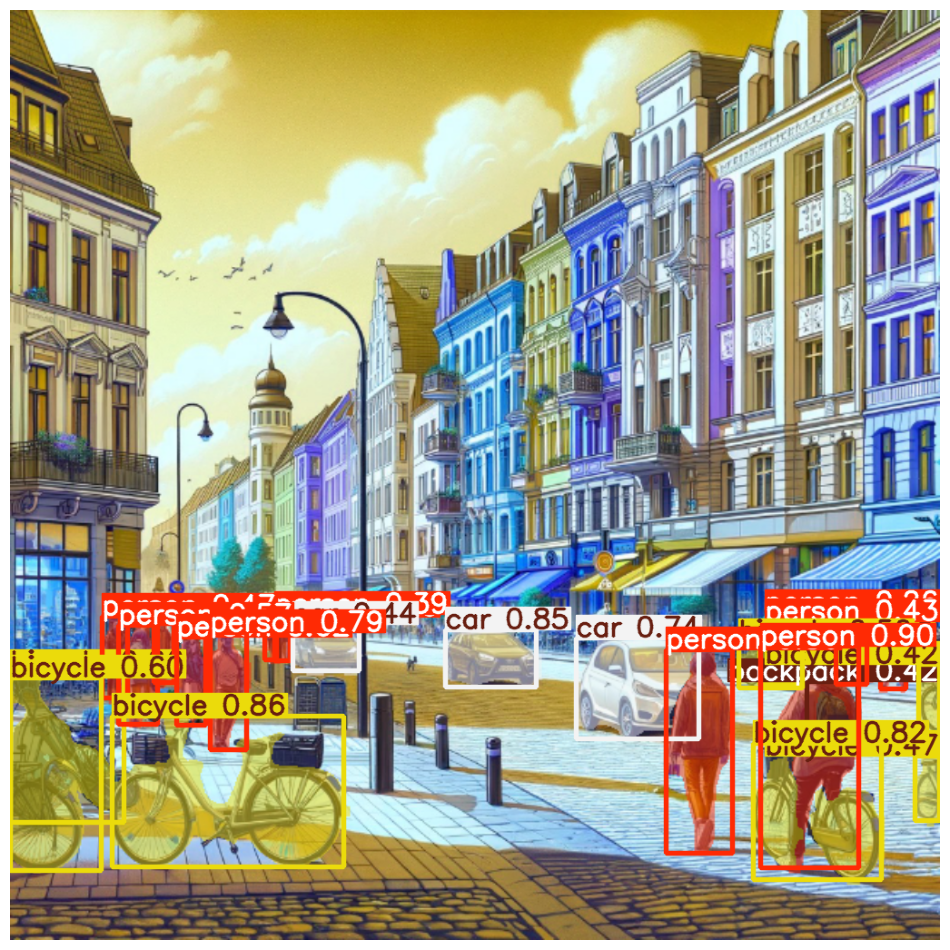

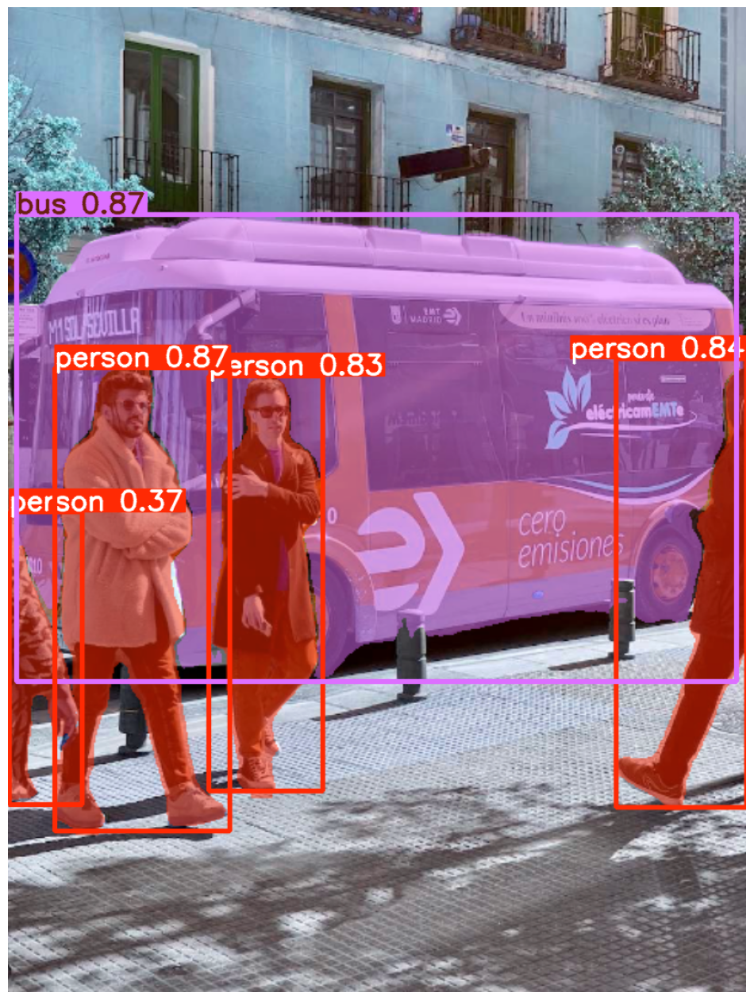

In [10]:
model = YOLO('Resultados/yolo11n-seg.pt')
image_paths = ["recursos/deteccion_objetos.jpg", "recursos/bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 4
De manera similar, podemos hacer la estimación de pose. Hazlo con las imágenes con las que estamos trabajando.


0: 640x640 2 persons, 6.5ms
1: 640x640 4 persons, 6.5ms
Speed: 1.6ms preprocess, 6.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


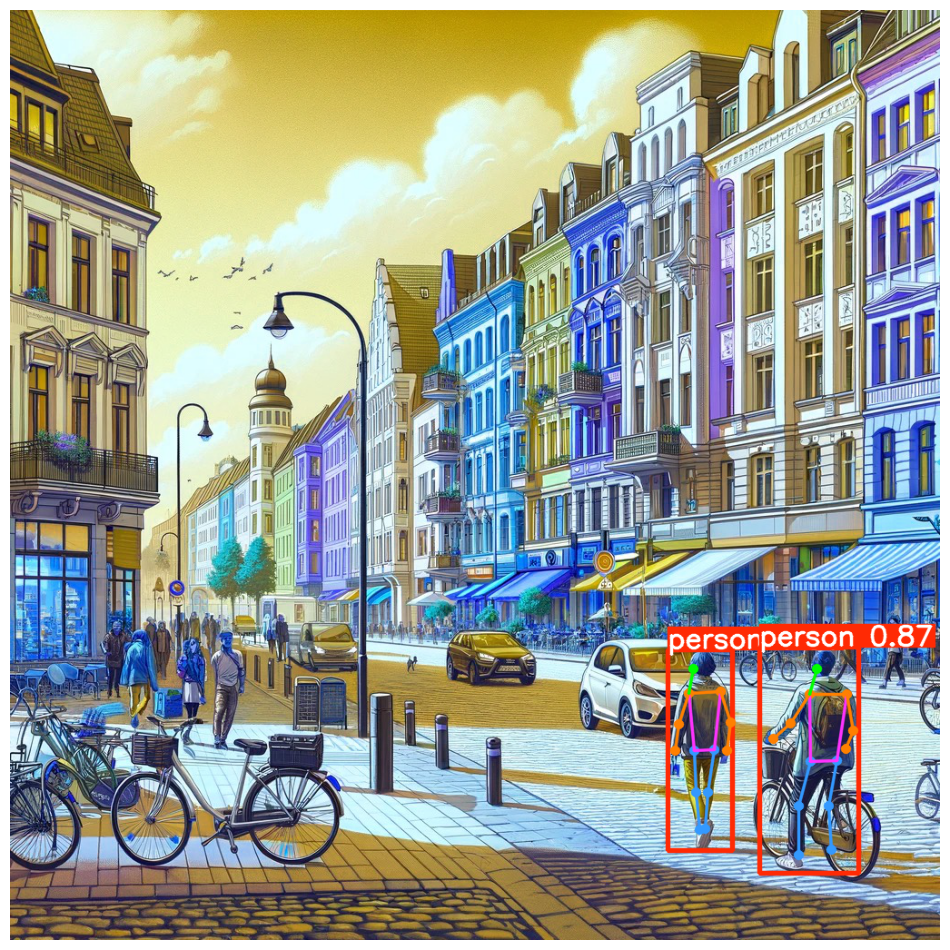

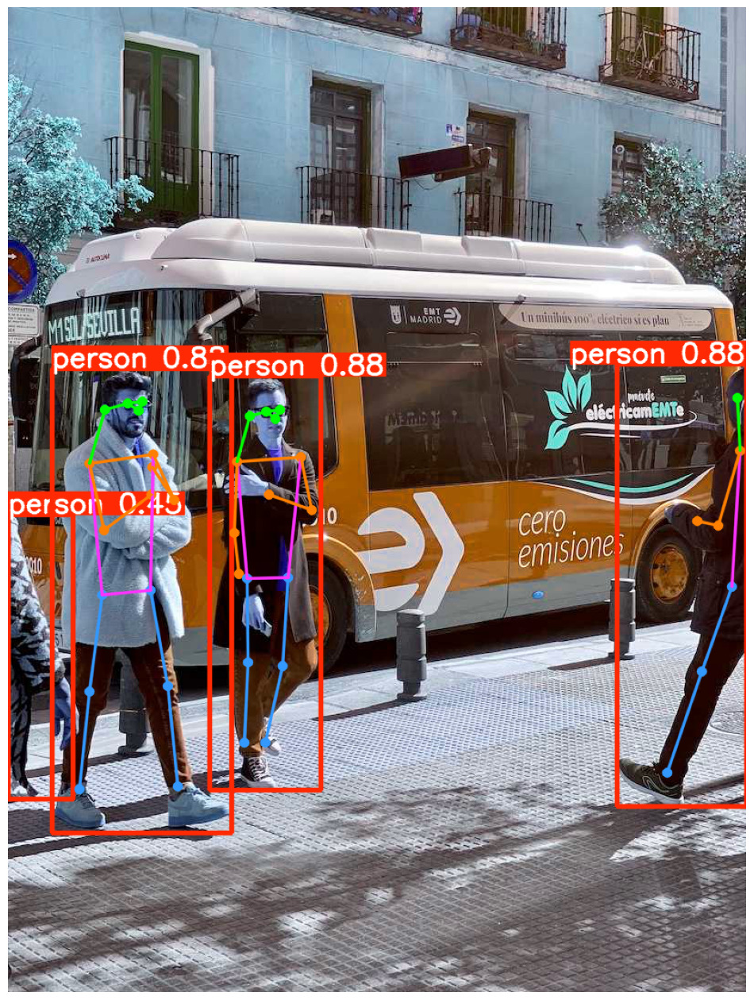

In [11]:
model = YOLO('Resultados/yolo11n-pose.pt')
image_paths = ["recursos/deteccion_objetos.jpg", "recursos/bus.jpg"]
results = model(image_paths)
for i,result in enumerate(results):
    image_with_boxes = results[i].plot()
    plt.figure(figsize=(12, 20)) 
    plt.imshow(image_with_boxes)
    plt.axis("off") 
    plt.show()

## EJERCICIO 5
Haz lo que se hace en el siguiente video:

https://www.youtube.com/watch?v=_YbEna8UNcU

Tienes parte del código en:

https://www.albertcoronado.com/2024/11/12/tutorial-yolo-11/

Para la parte fine tuning tienes que entrenar el modelo para que distina matrículas de coche, para entrenar el modelo utiliza el dataset que puedes descargar de:

https://universe.roboflow.com/parag-parmar-3qpin/car_license_plate-ypwmk/dataset/1

NOTA: HE CONSEGUIDO QUE FUNCIONE BIEN CV2 PERO ABRIENDO PRIMERO UNA IMAGEN:
```
img = cv2.imread('Datos/image3.jpg')
cv2.imshow("SAPA", img)
cv2.waitKey(0)
cv2.destroyAllWindows()
```

## Procesando imágenes con YOLO 11 y Python

In [12]:
model = YOLO("yolo11n.pt")

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 240, 0)
thickness = 1

img = cv2.imread( 'recursos/img2.jpg' ) 
results = model(img)

for r in results:
    for box in r.boxes:
        x1, y1, x2, y2 = box.xyxy[0]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

        confidence = math.ceil((box.conf[0]*100))
            
        cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
        cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

cv2.imshow('Webcam', img)

while True:
    if cv2.waitKey(1) == ord('q'):
        break

cv2.destroyAllWindows()


0: 448x640 1 person, 1 car, 1 dog, 3.7ms
Speed: 1.4ms preprocess, 3.7ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)


QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is n

## Procesando vídeo de la webcam con YOLO 11 y Python

In [41]:
model = YOLO("Resultados/yolo11x.pt")
cap = cv2.VideoCapture(0)

font = cv2.FONT_HERSHEY_SIMPLEX
fontScale = 0.7
color = (0, 250, 0)
thickness = 2

while True:
    success, img = cap.read()
    results = model( img, stream=True )

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)

            confidence = math.ceil((box.conf[0]*100))
            
            cv2.rectangle(img, ( x1, y1 ), ( x2, y2 ), color, 1)
            cv2.putText(img, r.names[ int( box.cls[0] ) ]+" "+str(confidence)+"%", [ x1+4, y1+25 ], font, fontScale, color, thickness)

    cv2.imshow('Webcam', img)

    if cv2.waitKey(1) == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()


0: 480x640 5 persons, 1 book, 17.5ms
Speed: 1.1ms preprocess, 17.5ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 15.7ms
Speed: 1.4ms preprocess, 15.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 14.6ms
Speed: 0.8ms preprocess, 14.6ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 6 persons, 1 book, 16.9ms
Speed: 2.3ms preprocess, 16.9ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 19.0ms
Speed: 0.8ms preprocess, 19.0ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 6 persons, 19.0ms
Speed: 0.8ms preprocess, 19.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 20.9ms
Speed: 0.8ms preprocess, 20.9ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)



QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is not the object's thread (0x5383dca0).
Cannot move to target thread (0x503616f0)

QObject::moveToThread: Current thread (0x503616f0) is n

0: 480x640 5 persons, 1 book, 19.4ms
Speed: 0.8ms preprocess, 19.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 20.8ms
Speed: 0.9ms preprocess, 20.8ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 17.7ms
Speed: 1.2ms preprocess, 17.7ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 6 persons, 1 book, 18.6ms
Speed: 1.0ms preprocess, 18.6ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 18.4ms
Speed: 0.8ms preprocess, 18.4ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 18.8ms
Speed: 0.8ms preprocess, 18.8ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 5 persons, 1 book, 18.5ms
Speed: 0.9ms preprocess, 18.5ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 6 persons, 1 book, 19.6ms
Speed: 0.8ms prepr

## Fine-tunning con YOLO 11

In [6]:
!yolo task=detect mode=train epochs=20 batch=10 model='yolo11s' data='/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/dataset/coches/data.yaml'

New https://pypi.org/project/ultralytics/8.3.71 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=yolo11s, data=/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/dataset/coches/data.yaml, epochs=20, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nm

In [15]:
!yolo predict model='/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/runs/detect/train10/weights/best.pt' source='/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/recursos/matriculas.jpg' conf=0.45

Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs

image 1/1 /home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/recursos/matriculas.jpg: 448x640 2 licences, 63.3ms
Speed: 4.2ms preprocess, 63.3ms inference, 108.8ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


<img src="runs/detect/predict4/matriculas.jpg" alt="matriculas.jpg" width="800"/>


## EJERCICIO 6
Repite el fine tuning del apartado anterior pero ahora en vez de como un comando en la terminal con código de python

In [6]:
# Cargar el modelo
model = YOLO('yolo11s')

# Entrenar el modelo
model.train(
    task='detect',
    mode='train',
    epochs=20,
    batch=10,
    data='/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/dataset/coches/data.yaml'
)

# Guardar el modelo entrenado
model.save('cuenta_matriculas.pt')   # Guardar el modelo en un archivo

New https://pypi.org/project/ultralytics/8.3.71 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
engine/trainer: task=detect, mode=train, model=yolo11s.pt, data=/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/dataset/coches/data.yaml, epochs=20, time=None, patience=100, batch=10, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_

train: Scanning /home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/dataset/coches/train/labels.cache... 210 images, 0 backgrounds, 0 corrupt: 100%|██████████| 210/210 [00:00<?, ?it/s]
val: Scanning /home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/dataset/coches/valid/labels.cache... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<?, ?it/s]


Plotting labels to runs/detect/train9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.00046875), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train9
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      3.21G      1.813      7.614      1.604         22        640: 100%|██████████| 21/21 [00:02<00:00,  7.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.08it/s]

                   all         60         64      0.356      0.266       0.24      0.117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      3.01G      1.682      2.791      1.368         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 10.06it/s]

                   all         60         64      0.329      0.328      0.166      0.075



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20         3G      1.757      2.022      1.492         15        640: 100%|██████████| 21/21 [00:02<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 10.05it/s]

                   all         60         64      0.363      0.406      0.281      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20         3G      1.788      1.702      1.452         16        640: 100%|██████████| 21/21 [00:02<00:00,  7.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.77it/s]

                   all         60         64     0.0715       0.25     0.0348     0.0136



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20         3G       1.77       1.67      1.466         24        640: 100%|██████████| 21/21 [00:02<00:00,  7.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.89it/s]

                   all         60         64     0.0473       0.25     0.0224    0.00963



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20         3G      1.751      1.534      1.474         15        640: 100%|██████████| 21/21 [00:02<00:00,  7.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  8.71it/s]

                   all         60         64     0.0553      0.422     0.0398     0.0157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20         3G      1.699      1.262      1.411         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.80it/s]

                   all         60         64      0.292      0.422       0.19     0.0956



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20         3G      1.636      1.218      1.424         23        640: 100%|██████████| 21/21 [00:02<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.35it/s]

                   all         60         64      0.524      0.378      0.425      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.99G      1.701      1.308      1.467         24        640: 100%|██████████| 21/21 [00:02<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.29it/s]

                   all         60         64      0.673      0.266      0.351      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20         3G      1.635       1.19       1.42         30        640: 100%|██████████| 21/21 [00:02<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 12.25it/s]

                   all         60         64      0.557      0.656      0.614      0.328


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.99G      1.641      1.231      1.476         13        640: 100%|██████████| 21/21 [00:03<00:00,  6.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.80it/s]

                   all         60         64      0.827      0.469      0.581      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20         3G      1.607      1.158      1.415         10        640: 100%|██████████| 21/21 [00:02<00:00,  9.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 11.60it/s]

                   all         60         64      0.809      0.609      0.695      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.99G      1.558      1.102      1.395         10        640: 100%|██████████| 21/21 [00:02<00:00,  8.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.55it/s]

                   all         60         64      0.761      0.516      0.631      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20         3G      1.516      1.074      1.342         10        640: 100%|██████████| 21/21 [00:02<00:00,  7.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.28it/s]

                   all         60         64      0.793      0.719      0.795      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20         3G      1.451       1.07      1.335         12        640: 100%|██████████| 21/21 [00:02<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.22it/s]

                   all         60         64       0.78      0.666      0.764      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20         3G      1.563       1.02      1.376         11        640: 100%|██████████| 21/21 [00:02<00:00,  7.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.56it/s]

                   all         60         64      0.678      0.734      0.737      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20         3G      1.479     0.9557      1.362         10        640: 100%|██████████| 21/21 [00:02<00:00,  7.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.51it/s]

                   all         60         64      0.779      0.781      0.799      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20         3G      1.453     0.9543      1.314         13        640: 100%|██████████| 21/21 [00:02<00:00,  7.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.76it/s]

                   all         60         64      0.802      0.719      0.828      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.99G      1.461     0.8928      1.321         11        640: 100%|██████████| 21/21 [00:02<00:00,  7.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  9.78it/s]

                   all         60         64      0.846      0.734      0.849      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20         3G      1.385     0.8921      1.289         13        640: 100%|██████████| 21/21 [00:02<00:00,  7.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00, 10.08it/s]

                   all         60         64      0.824      0.797      0.864      0.458



20 epochs completed in 0.020 hours.
Optimizer stripped from runs/detect/train9/weights/last.pt, 19.2MB
Optimizer stripped from runs/detect/train9/weights/best.pt, 19.2MB

Validating runs/detect/train9/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.12.8 torch-2.6.0+cu124 CUDA:0 (NVIDIA GeForce RTX 4080 Laptop GPU, 12003MiB)
YOLO11s summary (fused): 238 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.03it/s]


                   all         60         64      0.823      0.797      0.864      0.459
Speed: 0.5ms preprocess, 2.6ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train9



image 1/1 /home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/recursos/matriculas.jpg: 448x640 2 licences, 4.9ms
Speed: 1.2ms preprocess, 4.9ms inference, 0.8ms postprocess per image at shape (1, 3, 448, 640)


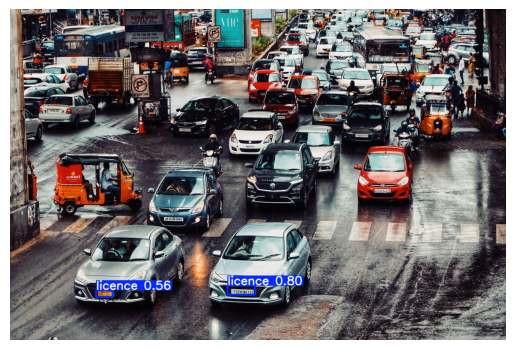

In [32]:
# Realizar predicción
model_predict = YOLO('/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/runs/detect/train5/weights/best.pt')
results = model_predict.predict(
    source='/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/recursos/matriculas.jpg',
    conf=0.45
)
# Mostrar la imagen de salida
for result in results:
    img = result.plot()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

## EJERCICIO 7
Vamos a contar los pasajeros de un autobus.

Sigue las instrucciones del siguiente video:

https://www.youtube.com/watch?v=hTI0Aj__SLE

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS


In [10]:
from ultralytics.solutions.solutions import BaseSolution
from ultralytics.utils.plotting import Annotator, colors
import csv
from datetime import datetime
import os


class ObjectCounter(BaseSolution):
    """
    Clase para gestionar el conteo de objetos en un flujo de video en tiempo real basado en sus trayectorias.

    Esta clase extiende BaseSolution y permite contar objetos que entran y salen de una región específica en un video.
    Admite regiones tanto poligonales como lineales para el conteo.
    
    Atributos:
        in_count (int): Contador de objetos que ingresan a la región.
        out_count (int): Contador de objetos que salen de la región.
        counted_ids (List[int]): Lista de IDs de objetos que han sido contados.
        saved_ids (List[int]): Lista de IDs de objetos guardados en un archivo CSV.
        classwise_counts (Dict[str, Dict[str, int]]): Diccionario con los conteos organizados por clase de objeto.
        region_initialized (bool): Indica si la región de conteo ha sido inicializada.
        show_in (bool): Controla la visualización del conteo de entradas.
        show_out (bool): Controla la visualización del conteo de salidas.
    """

    def __init__(self, **kwargs):
        """Inicializa la clase ObjectCounter para el conteo en tiempo real de objetos en videos."""
        super().__init__(**kwargs)

        self.in_count = 0  # Contador de objetos que ingresan
        self.out_count = 0  # Contador de objetos que salen
        self.counted_ids = []  # Lista de IDs de objetos contados
        self.saved_ids = []  # Lista de IDs guardados en CSV
        self.classwise_counts = {}  # Diccionario para conteo por clase
        self.region_initialized = False  # Variable booleana para la inicialización de la región

        self.show_in = self.CFG.get("show_in", True)
        self.show_out = self.CFG.get("show_out", True)

    def save_label_to_csv(self, track_id, label, action):
        """Guarda la etiqueta, track_id, acción y la hora actual en un archivo CSV con la fecha actual."""
        if track_id in self.saved_ids:
            return  # No guardar si el ID ya ha sido registrado

        current_time = datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        current_date = datetime.now().strftime("%Y-%m-%d")

        filename = f'tracked_objects_{current_date}.csv'  # Nombre del archivo CSV basado en la fecha
        file_exists = os.path.isfile(filename)

        with open(filename, mode='a', newline='') as file:
            writer = csv.writer(file)
            if not file_exists:
                writer.writerow(['track_id', 'label', 'action', 'date', 'time'])  # Escribir encabezados si el archivo es nuevo
            writer.writerow([track_id, label, action, current_time.split()[0], current_time.split()[1]])
            self.saved_ids.append(track_id)  # Marcar el ID como guardado

    def count_objects(self, current_centroid, track_id, prev_position, cls):
        """
        Cuenta objetos dentro de una región poligonal o lineal basada en sus trayectorias.

        Args:
            current_centroid (Tuple[float, float]): Coordenadas del centroide en el fotograma actual.
            track_id (int): Identificador único del objeto.
            prev_position (Tuple[float, float]): Posición anterior del objeto.
            cls (int): Índice de la clase del objeto.
        """
        if prev_position is None or track_id in self.counted_ids:
            return

        action = None  # Acción predeterminada

        if len(self.region) == 2:  # Región lineal
            line = self.LineString(self.region)
            if line.intersects(self.LineString([prev_position, current_centroid])):
                if abs(self.region[0][0] - self.region[1][0]) < abs(self.region[0][1] - self.region[1][1]):
                    if current_centroid[0] > prev_position[0]:  # Movimiento a la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento a la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Movimiento hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        elif len(self.region) > 2:  # Región poligonal
            polygon = self.Polygon(self.region)
            if polygon.contains(self.Point(current_centroid)):
                region_width = max(p[0] for p in self.region) - min(p[0] for p in self.region)
                region_height = max(p[1] for p in self.region) - min(p[1] for p in self.region)

                if region_width < region_height:
                    if current_centroid[0] > prev_position[0]:  # Movimiento a la derecha
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento a la izquierda
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                else:
                    if current_centroid[1] > prev_position[1]:  # Movimiento hacia abajo
                        self.in_count += 1
                        self.classwise_counts[self.names[cls]]["IN"] += 1
                        action = "IN"
                    else:  # Movimiento hacia arriba
                        self.out_count += 1
                        self.classwise_counts[self.names[cls]]["OUT"] += 1
                        action = "OUT"
                self.counted_ids.append(track_id)

        if action:
            label = f"{self.names[cls]} ID: {track_id}"
            self.save_label_to_csv(track_id, label, action)

    def display_counts(self, im0):
        """Muestra los conteos de objetos en la imagen de entrada."""
        labels_dict = {
            str.capitalize(key): f"{'IN ' + str(value['IN']) if self.show_in else ''} "
            f"{'OUT ' + str(value['OUT']) if self.show_out else ''}".strip()
            for key, value in self.classwise_counts.items()
            if value["IN"] != 0 or value["OUT"] != 0
        }
        if labels_dict:
            self.annotator.display_analytics(im0, labels_dict, (104, 31, 17), (255, 255, 255), 10)

    def count(self, im0):
        """Procesa los fotogramas o las trayectorias y actualiza los conteos de objetos."""
        if not self.region_initialized:
            self.initialize_region()
            self.region_initialized = True

        self.annotator = Annotator(im0, line_width=self.line_width)
        self.extract_tracks(im0)
        self.annotator.draw_region(reg_pts=self.region, color=(104, 0, 123), thickness=self.line_width * 2)
        self.display_counts(im0)
        self.display_output(im0)
        return im0


In [11]:
import cv2
#from tracker1 import ObjectCounter  # Importar ObjectCounter desde tracker.py

# Definir la función de callback del mouse
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Verificar si el mouse se mueve
        point = [x, y]
        print(f"El mouse se movió a: {point}")

# Abrir el archivo de video
cap = cv2.VideoCapture('/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/bus-passengers-count-main/1.mp4')

# Definir los puntos de la región para el conteo de objetos
region_points = [(386, 103), (458, 499)]

# Inicializar el contador de objetos
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="yolo11s.pt",  # Modelo utilizado para el conteo de objetos
    classes=[0],  # Detectar solo la clase "persona"
    show_in=True,  # Mostrar el conteo de entradas
    show_out=True,  # Mostrar el conteo de salidas
    line_width=2,  # Ajustar el grosor de la línea de visualización
)

# Crear una ventana con nombre y asignar la función de callback del mouse
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0  # Contador de fotogramas

while True:
    # Leer un fotograma del video
    ret, frame = cap.read()
    if not ret:
        break  # Si el video termina, salir del bucle
        # Para reiniciar el video desde el principio, descomenta las siguientes líneas:
        # cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
        # continue

    count += 1
    if count % 2 != 0:  # Saltar los fotogramas impares para mejorar el rendimiento
        continue

    # Redimensionar el fotograma a 1020x500 píxeles
    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Mostrar el fotograma procesado
    cv2.imshow("RGB", frame)
    
    # Si se presiona la tecla 'q', salir del bucle
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

# Liberar el objeto de captura de video y cerrar la ventana de visualización
cap.release()
cv2.destroyAllWindows()


Ultralytics Solutions: ✅ {'region': [(386, 103), (458, 499)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': 'yolo11s.pt', 'classes': [0], 'line_width': 2}



QObject::moveToThread: Current thread (0x47c25180) is not the object's thread (0x484c34d0).
Cannot move to target thread (0x47c25180)

QObject::moveToThread: Current thread (0x47c25180) is not the object's thread (0x484c34d0).
Cannot move to target thread (0x47c25180)

QObject::moveToThread: Current thread (0x47c25180) is not the object's thread (0x484c34d0).
Cannot move to target thread (0x47c25180)

QObject::moveToThread: Current thread (0x47c25180) is not the object's thread (0x484c34d0).
Cannot move to target thread (0x47c25180)

QObject::moveToThread: Current thread (0x47c25180) is not the object's thread (0x484c34d0).
Cannot move to target thread (0x47c25180)

QObject::moveToThread: Current thread (0x47c25180) is not the object's thread (0x484c34d0).
Cannot move to target thread (0x47c25180)

QObject::moveToThread: Current thread (0x47c25180) is not the object's thread (0x484c34d0).
Cannot move to target thread (0x47c25180)

QObject::moveToThread: Current thread (0x47c25180) is n

0: 320x640 6 persons, 5.7ms
Speed: 2.6ms preprocess, 5.7ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 640)

0: 320x640 5 persons, 5.5ms
Speed: 1.6ms preprocess, 5.5ms inference, 1.7ms postprocess per image at shape (1, 3, 320, 640)
El mouse se movió a: [78, 187]
El mouse se movió a: [94, 200]

0: 320x640 4 persons, 5.8ms
Speed: 1.8ms preprocess, 5.8ms inference, 1.5ms postprocess per image at shape (1, 3, 320, 640)
El mouse se movió a: [142, 233]
El mouse se movió a: [155, 239]

0: 320x640 4 persons, 5.3ms
Speed: 1.2ms preprocess, 5.3ms inference, 1.0ms postprocess per image at shape (1, 3, 320, 640)
El mouse se movió a: [190, 236]

0: 320x640 4 persons, 4.6ms
Speed: 1.1ms preprocess, 4.6ms inference, 1.4ms postprocess per image at shape (1, 3, 320, 640)
El mouse se movió a: [204, 218]

0: 320x640 5 persons, 5.2ms
Speed: 1.0ms preprocess, 5.2ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)
El mouse se movió a: [208, 209]
El mouse se movió a: [208, 20

## EJERCICIO 8
Adapta el código anterior para que cuente vehículos en el video vehicle-counting.mp4 (tiene que contar por separado coches y camiones)

In [ ]:
import cv2
from tracker1 import ObjectCounter  # Importar ObjectCounter desde tracker.py

# Definir la función de callback del mouse
def RGB(event, x, y, flags, param):
    if event == cv2.EVENT_MOUSEMOVE:  # Verificar si el mouse se mueve
        point = [x, y]
        print(f"El mouse se movió a: {point}")

# Abrir el archivo de video
cap = cv2.VideoCapture('vehicle-counting.mp4')

# Definir los puntos de la región para el conteo de objetos
region_points = [(10, 300), (1000, 300)]

# Inicializar el contador de objetos
counter = ObjectCounter(
    region=region_points,  # Pasar los puntos de la región
    model="yolo11s.pt",  # Modelo utilizado para el conteo de objetos
    classes=[2, 7],  # Detectar solo las clases de vehículos (automóviles y camiones)
    show_in=True,  # Mostrar el conteo de entradas
    show_out=True,  # Mostrar el conteo de salidas
    line_width=2,  # Ajustar el grosor de la línea de visualización
)

# Crear una ventana con nombre y asignar la función de callback del mouse
cv2.namedWindow('RGB')
cv2.setMouseCallback('RGB', RGB)

count = 0  # Contador de fotogramas

while True:
    # Leer un fotograma del video
    ret, frame = cap.read()
    if not ret:
        break  # Si el video termina, salir del bucle
        # Para reiniciar el video desde el principio, descomenta las siguientes líneas:
        # cap.set(cv2.CAP_PROP_POS_FRAMES, 0)
        # continue

    count += 1
    if count % 2 != 0:  # Saltar los fotogramas impares para mejorar el rendimiento
        continue

    # Redimensionar el fotograma a 1020x500 píxeles
    frame = cv2.resize(frame, (1020, 500))

    # Procesar el fotograma con el contador de objetos
    frame = counter.count(frame)

    # Mostrar el fotograma procesado
    cv2.imshow("RGB", frame)

    # Si se presiona la tecla 'q', salir del bucle
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

# Liberar el objeto de captura de video y cerrar la ventana de visualización
cap.release()
cv2.destroyAllWindows()

## EJERCICIO 9
Adapta el ejercicio anterior para que en vez de coches cuente matrículas usando el modelo que has creado en el ejercicio 6. 

Si el video del apartado anterior no te sirve porque no se ven bien las matrículas crea un video con la IA generativa (si el video creado es demasiado corto junta varios videos en uno)

## EJERCICIO 10
Vamos a hacer fine tuning sobre el modelo para segmentación SAM-2.

Puedes sacar información de la siguiente página:

https://blog.roboflow.com/fine-tune-sam-2-1/

A la hora de conseguir el dataset, descargalo para no tener problemas con la API-KEY de Roboflow

In [1]:
!git clone https://github.com/facebookresearch/sam2.git sam2Main
!wget -O /content/sam2/sam2/configs/train.yaml 'https://drive.usercontent.google.com/download?id=11cmbxPPsYqFyWq87tmLgBAQ6OZgEhPG3'

Clonando en 'sam2Main'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Recibiendo objetos: 100% (1070/1070), 134.70 MiB | 17.34 MiB/s, listo.
Resolviendo deltas: 100% (376/376), listo.
/content/sam2/sam2/configs/train.yaml: No existe el archivo o el directorio


In [2]:
%cd ./sam2Main/
%pip install -e .[dev]
%pip install supervision -q
!cd ./checkpoints && ./download_ckpts.sh

/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/sam2Main
Obtaining file:///home/iabd/Documentos/IABD/IABD/IA/redes%20convolucionales/sam2Main
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for SAM-2 (pyproject.toml) ... done
  Created wheel for SAM-2: filename=SAM_2-1.0-0.editable-cp312-cp312-linux_x86_64.whl size=13841 sha256=10a8380b56314121adb6bbef553847b0c964281bbfcbb1cf2cc9ff99044b717a
  Stored in directory: /tmp/pip-ephem-wheel-cache-9d2k3rfy/wheels/4c/47/de/b48df313085bd6d5d3211daeff1a139d69f6109f97ebf602fd
Successfully built SAM-2
  Attempting uninstall: SAM-2
    Found existing installation: SAM-2 1.0
    Uninstalling SAM-2-1.0:
      Successfully uninstalled SAM-2-1.0
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated p

In [6]:
import os
import re

FOLDER = "/home/iabd/Descargas/Car Parts.v6i.sam2/train"

for filename in os.listdir(FOLDER):
    new_filename = filename.replace(".", "_", filename.count(".") - 1)
    if not re.search(r"_\d+\.\w+$", new_filename):
        new_filename = new_filename.replace(".", "_1.")
    os.rename(os.path.join(FOLDER, filename), os.path.join(FOLDER, new_filename))

In [7]:
!python training/train.py -c 'configs/train.yaml' --use-cluster 0 --num-gpus 1

###################### Train App Config ####################
scratch:
  resolution: 1024
  train_batch_size: 1
  num_train_workers: 10
  num_frames: 1
  max_num_objects: 3
  base_lr: 5.0e-06
  vision_lr: 3.0e-06
  phases_per_epoch: 1
  num_epochs: 40
dataset:
  img_folder: /home/iabd/Descargas/Car Parts.v6i.sam2/train
  gt_folder: /home/iabd/Descargas/Car Parts.v6i.sam2/train
  multiplier: 2
vos:
  train_transforms:
  - _target_: training.dataset.transforms.ComposeAPI
    transforms:
    - _target_: training.dataset.transforms.RandomHorizontalFlip
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomAffine
      degrees: 25
      shear: 20
      image_interpolation: bilinear
      consistent_transform: true
    - _target_: training.dataset.transforms.RandomResizeAPI
      sizes: ${scratch.resolution}
      square: true
      consistent_transform: true
    - _target_: training.dataset.transforms.ColorJitter
      consistent_transform: true
      brightness:

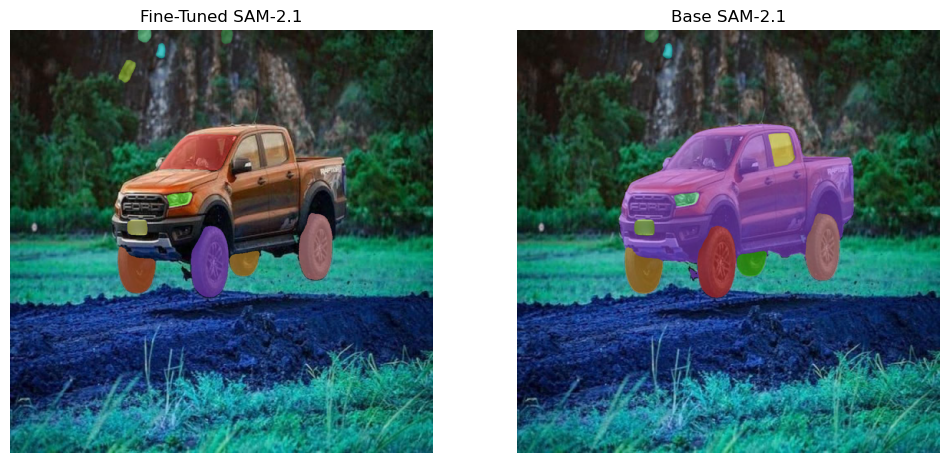

In [11]:
import torch
from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
import supervision as sv
import os
import random
from PIL import Image
import numpy as np

# use bfloat16 for the entire notebook
# from Meta notebook
torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

checkpoint = "/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/sam2Main/sam2_logs/configs/train.yaml/checkpoints/checkpoint.pt"
model_cfg = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2 = build_sam2(model_cfg, checkpoint, device="cuda")
mask_generator = SAM2AutomaticMaskGenerator(sam2)

checkpoint_base = "/home/iabd/Documentos/IABD/IABD/IA/redes convolucionales/sam2Main/checkpoints/sam2.1_hiera_base_plus.pt"
model_cfg_base = "configs/sam2.1/sam2.1_hiera_b+.yaml"
sam2_base = build_sam2(model_cfg_base, checkpoint_base, device="cuda")
mask_generator_base = SAM2AutomaticMaskGenerator(sam2_base)


validation_set = os.listdir("/home/iabd/Descargas/Car Parts.v6i.sam2/valid")

# choose random with .json extension
image = random.choice([img for img in validation_set if img.endswith(".jpg")])
image = os.path.join("/home/iabd/Descargas/Car Parts.v6i.sam2/valid", image)
opened_image = np.array(Image.open(image).convert("RGB"))
result = mask_generator.generate(opened_image)

detections = sv.Detections.from_sam(sam_result=result)

mask_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)
annotated_image = opened_image.copy()
annotated_image = mask_annotator.annotate(annotated_image, detections=detections)

base_annotator = sv.MaskAnnotator(color_lookup = sv.ColorLookup.INDEX)

base_result = mask_generator_base.generate(opened_image)
base_detections = sv.Detections.from_sam(sam_result=base_result)
base_annotated_image = opened_image.copy()
base_annotated_image = base_annotator.annotate(base_annotated_image, detections=base_detections)

sv.plot_images_grid(images=[annotated_image, base_annotated_image], titles=["Fine-Tuned SAM-2.1", "Base SAM-2.1"], grid_size=(1, 2))

## EJERCICIO 11 (OPCIONAL)
Haz fine tuning con sam2 o yolo11 para segmentación con otro dataset 

## EJERCICIO 12 (OPCIONAL)
En el siguiente enlace encontraras diferentes modelos y trabajos sobre la visión por computación, prueba alguno de ellos (algunos que no funcionan porque las librerías se han actualizado y tienes que adaptarlos, otros son recientes y no deberías tener problemas).

https://github.com/roboflow/notebooks

ELIMINA LOS COMENTARIOS QUE HAY EN EL CÓDIGO Y COMENTA EL CÓDIGO CON TUS PROPIAS PALABRAS